# Neuron masks from pseudo-FDT — two pipelines

Two independent pipelines run from the same pseudo-FDT field:

- **Pipeline A — SOMA-only** (Section 3). Round-blob detection: high
  FDT-percentile threshold + solidity filter + shape regularisation.
  Output: a clean mask of cell bodies, no dendritic lines.
- **Pipeline B — FULL-NEURON skeleton** (Section 4). Soma carving +
  skeletonisation of the dendrite support + leaf-branch pruning. Output:
  somas (filled) ∪ dilated dendrite trace.

Each pipeline has its own `CONFIG`, override cell, calibration cell
(one image), and batch cell (N images). The FDT computation is shared
in Section 2.


## 1. Imports + repo root


In [46]:
import sys
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter, distance_transform_edt
from skimage.draw import disk as draw_disk, ellipse as draw_ellipse
from skimage.filters import threshold_multiotsu, threshold_otsu
from skimage.measure import label as cc_label, regionprops
from skimage.morphology import (
    closing as morph_closing,
    convex_hull_image,
    dilation, disk,
    opening as morph_opening,
    remove_small_holes, remove_small_objects,
    skeletonize,
)

NB_DIR = Path.cwd().resolve()
REPO_ROOT = NB_DIR
while REPO_ROOT.parent != REPO_ROOT and not (REPO_ROOT / ".git").is_dir():
    REPO_ROOT = REPO_ROOT.parent
SRC_ROOT = REPO_ROOT / "src"
for p in (SRC_ROOT, REPO_ROOT):
    if str(p) not in sys.path:
        sys.path.insert(0, str(p))

# Shared leaf-pruning helper from the synaptic_ssl package (already used
# by the production density-skeleton branch).
from synaptic_ssl.pseudolabels.blobs import _prune_skeleton_branches

plt.rcParams["figure.dpi"] = 120
print("REPO_ROOT:", REPO_ROOT)


REPO_ROOT: /home/anokhin/anokhver/thesis


## 2. Shared helpers

The pseudo-FDT computation (`compute_pseudo_fdt`) is identical for both
pipelines. The biology-to-pixel-units conversion (`derive_size_params`
+ `resolve_cfg`) is used by Pipeline A's blob-min-area knobs.


In [47]:
def compute_pseudo_fdt(structural, cfg):
    """Robust-bg + fuzzy-membership + EDT*mu + Gaussian. Returns a dict."""
    structural = np.asarray(structural, dtype=np.float32)
    smoothed = gaussian_filter(structural, sigma=cfg["smooth_sigma"])

    bg = smoothed[smoothed <= np.percentile(smoothed, 50)]
    bg_med = float(np.median(bg))
    bg_mad = float(np.median(np.abs(bg - bg_med)))
    bg_sigma_robust = 1.4826 * bg_mad

    t_low = bg_med + cfg["bg_sigma_k"] * bg_sigma_robust
    fg = smoothed[smoothed > t_low]
    t_high = float(np.percentile(fg, cfg["t_high_fg_pct"])) if fg.size else t_low * 2.0
    scale = max(t_high - t_low, np.finfo(np.float32).eps)

    mu = np.clip((smoothed - t_low) / scale, 0.0, 1.0).astype(np.float32)
    support = mu > 0
    fdt = distance_transform_edt(support).astype(np.float32) * mu
    fdt = gaussian_filter(fdt, sigma=cfg["fdt_sigma"])

    return dict(
        smoothed=smoothed, mu=mu, support=support, fdt=fdt,
        bg_med=bg_med, bg_sigma=bg_sigma_robust,
        t_low=t_low, t_high=t_high,
    )


def derive_size_params(cfg):
    """Pixel-unit blob knobs from pixel_size_nm + biology."""
    px_um = cfg["pixel_size_nm"] / 1000.0
    return dict(
        blob_min_area=int(round(np.pi * (cfg["min_soma_diameter_um"] / 2.0 / px_um) ** 2)),
        hole_max_area=int(round(np.pi * (cfg["max_hole_diameter_um"] / 2.0 / px_um) ** 2)),
        open_radius=max(1, int(round(cfg["neck_width_um"] / 2.0 / px_um))),
    )


def resolve_cfg(cfg):
    """Return a copy of cfg with any None size knob filled from biology."""
    out = dict(cfg)
    derived = derive_size_params(cfg)
    for k, v in derived.items():
        if out.get(k) is None:
            out[k] = v
    return out


def _normalize_for_display(image):
    lo, hi = np.percentile(image, [1, 99])
    scale = max(hi - lo, np.finfo(np.float32).eps)
    return np.clip((image - lo) / scale, 0.0, 1.0)


def list_images(cfg):
    """Sorted list of .npy MIPs in cfg['no_patch_root']."""
    root = Path(cfg["no_patch_root"])
    files = sorted(root.glob("*.npy"))
    if not files:
        raise FileNotFoundError(f"no .npy MIPs found under {root}")
    return files


---
# Pipeline A — SOMA-only (round blobs)

High FDT-percentile threshold + solidity filter + shape regularisation.
Output is `mask` covering only round / thick structures (cell bodies),
zero dendritic lines.


### 3.1 Soma CONFIG


In [49]:
SOMA_CONFIG = dict(
    # ---- Data ----------------------------------------------------------
    no_patch_root="/run/media/anokhin/WinDocuments/anokhver/thesis/data/Microscopy_no_patch/20251205",
    structural_channel=2,
    file_index=0,
    batch_size=10,

    # ---- Hardware + biology --------------------------------------------
    pixel_size_nm=107.0,
    min_soma_diameter_um=3.0,
    max_hole_diameter_um=2.5,
    neck_width_um=0.3,

    # ---- Pseudo-FDT pipeline -------------------------------------------
    smooth_sigma=3.0,
    bg_sigma_k=3.0,
    t_high_fg_pct=80.0,
    fdt_sigma=1.0,

    # ---- Blob threshold on FDT field -----------------------------------
    blob_threshold_method="percentile",  # 'percentile' | 'otsu' | 'multi_otsu'
    blob_fdt_pct=90.0,
    blob_fdt_multi_classes=3,

    # ---- Cleanup -------------------------------------------------------
    blob_min_area=None,            # None -> derived (~617 px at 107 nm/px)
    hole_max_area=None,            # None -> derived
    open_radius=None,              # None -> derived
    min_solidity=0.7,
    dilate_r=5,

    # ---- Shape regularisation ------------------------------------------
    shape_mode="convex",           # 'raw' | 'closing' | 'convex' | 'ellipse' | 'circle'
    closing_radius=8,              # used iff shape_mode='closing'

    # ---- Display -------------------------------------------------------
    overlay_dim=0.6,
    fdt_clip_pct=99.0,
)

# Sanity print so you see what the pipeline will actually use.
_resolved = resolve_cfg(SOMA_CONFIG)
print(f"pixel_size = {SOMA_CONFIG['pixel_size_nm']} nm/px")
for k in ("blob_min_area", "hole_max_area", "open_radius"):
    src = "manual" if SOMA_CONFIG.get(k) is not None else "auto"
    print(f"  {k:14s} = {_resolved[k]:>5d}   ({src})")


pixel_size = 107.0 nm/px
  blob_min_area  =   617   (auto)
  hole_max_area  =   429   (auto)
  open_radius    =     1   (auto)


### 3.2 Soma pipeline + visualisation


In [50]:
def _blob_threshold(fdt_pos, cfg):
    """Per-image FDT threshold per cfg['blob_threshold_method']."""
    if fdt_pos.size < 100:
        return float("inf"), "degenerate"
    method = cfg.get("blob_threshold_method", "percentile")
    if method == "percentile":
        return float(np.percentile(fdt_pos, cfg["blob_fdt_pct"])), method
    if method == "otsu":
        return float(threshold_otsu(fdt_pos)), method
    if method == "multi_otsu":
        ts = threshold_multiotsu(fdt_pos, classes=int(cfg.get("blob_fdt_multi_classes", 3)))
        return float(ts[-1]), method
    raise ValueError(f"unknown blob_threshold_method: {method!r}")


def _round_blobs(blob_mask, cfg):
    """Per-blob shape regularisation. Dispatches on cfg['shape_mode']."""
    if not blob_mask.any():
        return blob_mask
    mode = cfg.get("shape_mode", "raw")
    if mode == "raw":
        return blob_mask
    if mode == "closing":
        return morph_closing(blob_mask, disk(int(cfg.get("closing_radius", 8))))
    lbl = cc_label(blob_mask, connectivity=2)
    out = np.zeros_like(blob_mask, dtype=bool)
    for prop in regionprops(lbl):
        y0, x0, y1, x1 = prop.bbox
        if mode == "convex":
            sub = (lbl[y0:y1, x0:x1] == prop.label)
            out[y0:y1, x0:x1] |= convex_hull_image(sub)
        elif mode == "ellipse":
            ry = max(prop.major_axis_length / 2.0, 1.0)
            rx = max(prop.minor_axis_length / 2.0, 1.0)
            cy, cx = prop.centroid
            rr, cc = draw_ellipse(cy, cx, ry, rx,
                                  rotation=-prop.orientation,
                                  shape=blob_mask.shape)
            out[rr, cc] = True
        elif mode == "circle":
            r = max(prop.equivalent_diameter_area / 2.0, 1.0)
            cy, cx = prop.centroid
            rr, cc = draw_disk((cy, cx), r, shape=blob_mask.shape)
            out[rr, cc] = True
        else:
            raise ValueError(f"unknown shape_mode: {mode!r}")
    return out


def extract_soma_mask(fdt, cfg):
    """High-FDT threshold + cleanup + solidity + shape + dilation."""
    cfg = resolve_cfg(cfg)
    fdt_pos = fdt[fdt > 0]
    threshold, method = _blob_threshold(fdt_pos, cfg)

    blob = fdt > threshold
    blob = remove_small_objects(blob, max_size=max(0, int(cfg["blob_min_area"]) - 1))
    if cfg["hole_max_area"] > 0 and blob.any():
        blob = remove_small_holes(blob, max_size=max(0, int(cfg["hole_max_area"]) - 1))
    if cfg["open_radius"] > 0 and blob.any():
        blob = morph_opening(blob, disk(int(cfg["open_radius"])))

    n_raw = int(cc_label(blob).max())
    if cfg["min_solidity"] > 0.0 and blob.any():
        lbl = cc_label(blob, connectivity=2)
        kept = np.zeros_like(blob)
        for prop in regionprops(lbl):
            if (prop.solidity >= cfg["min_solidity"]
                    and prop.area >= int(cfg["blob_min_area"])):
                kept[lbl == prop.label] = True
        blob = kept
    n_kept = int(cc_label(blob).max())

    blob = _round_blobs(blob, cfg)

    mask = (dilation(blob, disk(int(cfg["dilate_r"])))
            if cfg["dilate_r"] > 0 and blob.any() else blob.copy())

    return dict(
        blob=blob, mask=mask,
        threshold=threshold, threshold_method=method,
        n_raw=n_raw, n_kept=n_kept,
        n_blobs=int(cc_label(mask).max()),
    )


def run_soma_on_image(image_path, cfg):
    full = np.load(image_path)
    structural = full[cfg["structural_channel"]].astype(np.float32)
    fdt_info = compute_pseudo_fdt(structural, cfg)
    blob_info = extract_soma_mask(fdt_info["fdt"], cfg)
    return structural, fdt_info, blob_info


def visualise_soma_mask(structural, fdt_info, blob_info, cfg, *, axes=None,
                         title_prefix=""):
    """3-panel: structural / FDT field with blob outline / mask overlay."""
    fdt = fdt_info["fdt"]
    fdt_pos = fdt[fdt > 0]
    fdt_vmax = float(np.percentile(fdt_pos, cfg["fdt_clip_pct"])) if fdt_pos.size else 1.0
    mask = blob_info["mask"]

    base = _normalize_for_display(structural) * cfg["overlay_dim"]
    overlay = np.dstack([base, base, base])
    blob_color = np.array([0.0, 1.0, 0.4], dtype=np.float32)
    if mask.any():
        overlay[mask] = 0.5 * overlay[mask] + 0.5 * blob_color
        overlay[dilation(mask, disk(1)) & ~mask] = blob_color
    overlay = np.clip(overlay, 0.0, 1.0)

    if axes is None:
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    else:
        fig = axes[0].figure
    axes[0].imshow(_normalize_for_display(structural), cmap="gray")
    axes[0].set_title(f"{title_prefix}structural".strip())
    axes[1].imshow(fdt, cmap="magma", vmin=0, vmax=fdt_vmax)
    axes[1].contour(mask, levels=[0.5], colors="lime", linewidths=0.5)
    axes[1].set_title(
        f"pseudo-FDT  thr[{blob_info['threshold_method']}]={blob_info['threshold']:.2f}"
    )
    axes[2].imshow(overlay)
    axes[2].set_title(
        f"SOMA mask [{cfg.get('shape_mode','raw')}] "
        f"({blob_info['n_blobs']} blobs, cov={mask.mean():.2%})"
    )
    for ax in axes:
        ax.set_xticks([]); ax.set_yticks([])
    return fig, axes


### 3.3 Soma overrides for calibration


In [51]:
# Uncomment any line to override the SOMA_CONFIG default for this run.
SOMA_CONFIG.update(
    # file_index=0,                          # which .npy in the folder (sorted, 0-based)

    # ---- Threshold on FDT field ----------------------------------------
    # 'percentile' adapts per image (keeps top X% by count). 'otsu' is
    # mid-strict. 'multi_otsu' keeps only the brightest, biggest cores.
    # blob_threshold_method="percentile",    # 'percentile' | 'otsu' | 'multi_otsu'
    blob_fdt_pct=95.0,                     # ^ stricter (fewer/larger blobs) | v more / dimmer blobs

    # ---- Cleanup -------------------------------------------------------
    # min_solidity is area / convex_hull -- rejects branchy / star shapes.
    min_solidity=0.4,                        # ^ stricter (only convex) | v looser (keep irregular blobs)

    # ---- Shape regularisation -----------------------------------------
    # How each kept CC is drawn:
    #   'raw'     -> jagged FDT contour (no rounding)
    #   'closing' -> binary_closing(disk(closing_radius)); gentle smoothing
    #   'convex'  -> convex_hull per CC; rounds out concavities
    #   'ellipse' -> perfect ellipse from regionprops centroid + axes
    #   'circle'  -> perfect disk at centroid, radius = equivalent_diameter/2
    shape_mode="closing",                   # 'raw' | 'closing' | 'convex' | 'ellipse' | 'circle'
    # closing_radius=8,                      # px; used iff shape_mode='closing'; ^ smoother
    # pre_merge_radius=0,                    # px; > 0 bridges fragmented CCs before shape draw

    # dilate_r=5,                            # px; final dilation -- ^ thicker mask boundary
)
_r = resolve_cfg(SOMA_CONFIG)
print(
    f"file_index   = {SOMA_CONFIG['file_index']}\n"
    f"thr_method   = {SOMA_CONFIG['blob_threshold_method']}  "
    f"pct={SOMA_CONFIG['blob_fdt_pct']}  K={SOMA_CONFIG['blob_fdt_multi_classes']}\n"
    f"min_solidity = {SOMA_CONFIG['min_solidity']}\n"
    f"shape_mode   = {SOMA_CONFIG['shape_mode']}  dilate_r={SOMA_CONFIG['dilate_r']}\n"
    f"sizes (resolved): blob_min={_r['blob_min_area']} hole_max={_r['hole_max_area']} open_r={_r['open_radius']}"
)


file_index   = 0
thr_method   = percentile  pct=95.0  K=3
min_solidity = 0.4
shape_mode   = closing  dilate_r=5
sizes (resolved): blob_min=617 hole_max=429 open_r=1


### 3.4 Soma calibration — one image


[0/89] 5_KONTROLA_10_Multichannel Z-Stack_20251205_128.npy
support=0.381  thr=32.81  raw_ccs=19 -> kept=19 -> final=19  cov=3.52%


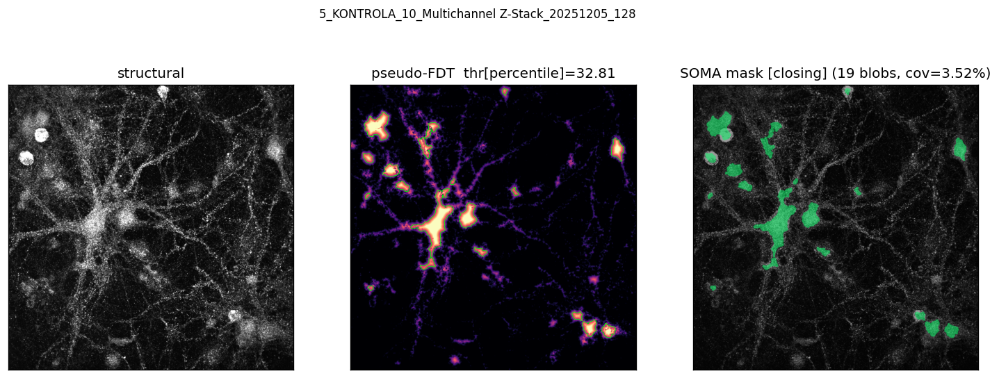

In [52]:
_soma_files = list_images(SOMA_CONFIG)
_soma_path = _soma_files[SOMA_CONFIG["file_index"]]
print(f"[{SOMA_CONFIG['file_index']}/{len(_soma_files)-1}] {_soma_path.name}")

_struct, _fdt, _blob = run_soma_on_image(_soma_path, SOMA_CONFIG)
print(
    f"support={_fdt['support'].mean():.3f}  "
    f"thr={_blob['threshold']:.2f}  "
    f"raw_ccs={_blob['n_raw']} -> kept={_blob['n_kept']} -> final={_blob['n_blobs']}  "
    f"cov={_blob['mask'].mean():.2%}"
)
fig, _ = visualise_soma_mask(_struct, _fdt, _blob, SOMA_CONFIG)
fig.suptitle(_soma_path.stem[:60], y=1.02, fontsize=10)
plt.show()


### 3.5 Soma batch — N images


In [56]:
_soma_files = list_images(SOMA_CONFIG)
_soma_batch = _soma_files[: int(SOMA_CONFIG["batch_size"])]
print(f"soma batch: {len(_soma_batch)} images")


soma batch: 10 images


  [ 0] 5_KONTROLA_10_Multichannel Z-Stack_20251205_128.np  n_blobs= 19  cov=3.52%  thr=32.81
  [ 1] 5_KONTROLA_1_Multichannel Z-Stack_20251205_119.npy  n_blobs= 19  cov=3.41%  thr=23.28
  [ 2] 5_KONTROLA_21_Multichannel Z-Stack_20251205_129.np  n_blobs= 20  cov=2.99%  thr=23.78
  [ 3] 5_KONTROLA_21_Multichannel Z-Stack_20251205_130.np  n_blobs= 29  cov=2.92%  thr=19.26
  [ 4] 5_KONTROLA_22_Multichannel Z-Stack_20251205_131.np  n_blobs= 17  cov=3.44%  thr=30.07
  [ 5] 5_KONTROLA_23_Multichannel Z-Stack_20251205_132.np  n_blobs= 18  cov=3.31%  thr=32.99
  [ 6] 5_KONTROLA_24_Multichannel Z-Stack_20251205_133.np  n_blobs= 12  cov=3.32%  thr=36.72
  [ 7] 5_KONTROLA_25_Multichannel Z-Stack_20251205_134.np  n_blobs= 25  cov=3.28%  thr=26.51
  [ 8] 5_KONTROLA_26_Multichannel Z-Stack_20251205_135.np  n_blobs= 13  cov=3.31%  thr=27.55
  [ 9] 5_KONTROLA_27_Multichannel Z-Stack_20251205_136.np  n_blobs= 13  cov=3.27%  thr=30.70


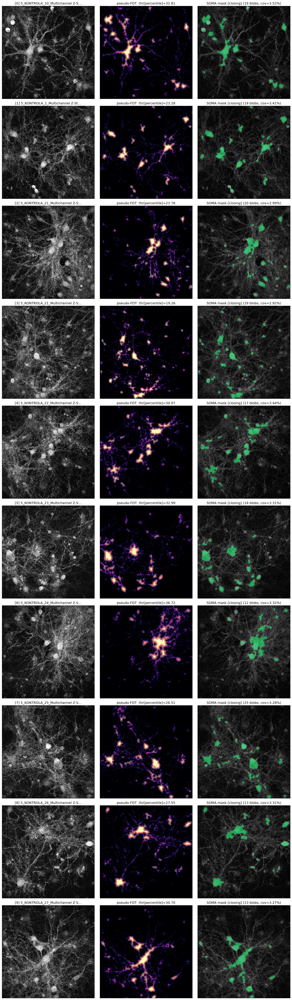


SOMA batch summary (10 images, method=percentile, shape=closing):
  n_blobs: mean=18.5  range=[12, 29]
  cov:     mean=3.28%  range=[2.92%, 3.52%]


In [57]:

fig, axes_grid = plt.subplots(len(_soma_batch), 3, figsize=(15, 5 * len(_soma_batch)))
if len(_soma_batch) == 1:
    axes_grid = np.atleast_2d(axes_grid)

_soma_stats = []
for i, path in enumerate(_soma_batch):
    structural, fdt_info, blob_info = run_soma_on_image(path, SOMA_CONFIG)
    visualise_soma_mask(structural, fdt_info, blob_info, SOMA_CONFIG,
                         axes=axes_grid[i], title_prefix=f"[{i}] ")
    axes_grid[i, 0].set_title(f"[{i}] {path.stem[:30]}…")
    _soma_stats.append(dict(
        idx=i, name=path.name,
        n_blobs=blob_info["n_blobs"], cov=float(blob_info["mask"].mean()),
        thr=blob_info["threshold"],
    ))
    print(f"  [{i:2d}] {path.name[:50]:50s}  "
          f"n_blobs={blob_info['n_blobs']:3d}  cov={blob_info['mask'].mean():.2%}  "
          f"thr={blob_info['threshold']:.2f}")
plt.tight_layout()
plt.show()

_n = [s["n_blobs"] for s in _soma_stats]
_c = [s["cov"] for s in _soma_stats]
print(
    f"\nSOMA batch summary ({len(_soma_stats)} images, "
    f"method={SOMA_CONFIG['blob_threshold_method']}, shape={SOMA_CONFIG['shape_mode']}):\n"
    f"  n_blobs: mean={np.mean(_n):.1f}  range=[{min(_n)}, {max(_n)}]\n"
    f"  cov:     mean={np.mean(_c):.2%}  range=[{min(_c):.2%}, {max(_c):.2%}]"
)
